# Computer Vision Masterclass - Face detection


## OpenCV


### Loading the image


In [1]:
import cv2

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/people1.jpg')

In [4]:
image.shape

(1280, 1920, 3)

In [5]:
from google.colab.patches import cv2_imshow
cv2_imshow(image)

Output hidden; open in https://colab.research.google.com to view.

In [6]:
image = cv2.resize(image, (800, 600))
image.shape

(600, 800, 3)

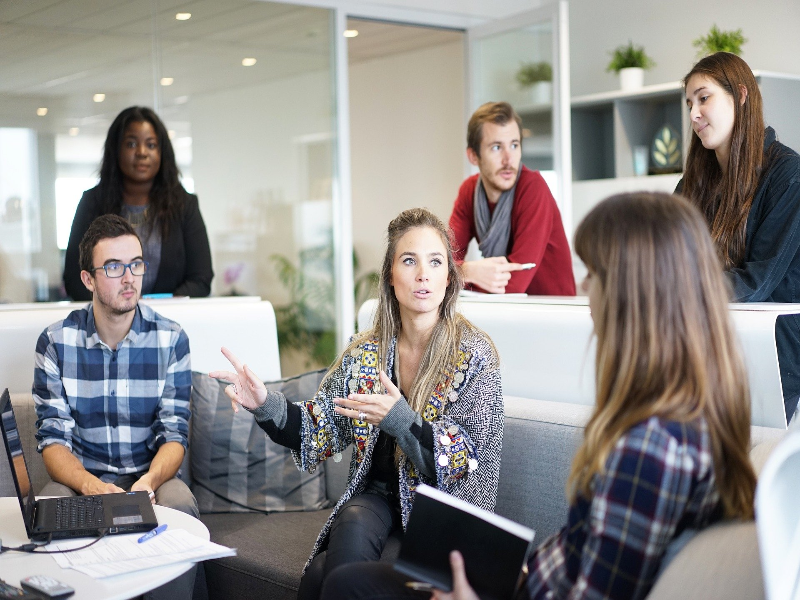

In [7]:
cv2_imshow(image)

In [8]:
600 * 800 * 3, 600 * 800, 1440000 - 480000

(1440000, 480000, 960000)

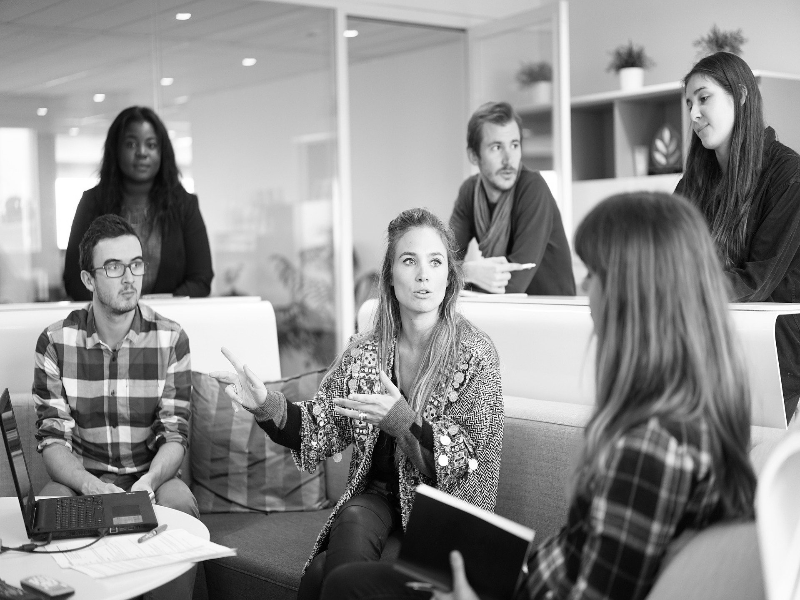

In [9]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

In [10]:
image.shape

(600, 800, 3)

In [11]:
image_gray.shape

(600, 800)

### Detecting faces


In [12]:
face_detector = cv2.CascadeClassifier(
    '/content/drive/MyDrive/Computer-Vision/Cascades/haarcascade_frontalface_default.xml')

In [13]:
detections = face_detector.detectMultiScale(image_gray)

In [14]:
detections

array([[115, 124,  53,  53],
       [677,  72,  68,  68],
       [475, 123,  59,  59],
       [390, 323,  56,  56],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66]], dtype=int32)

In [15]:
len(detections)

6

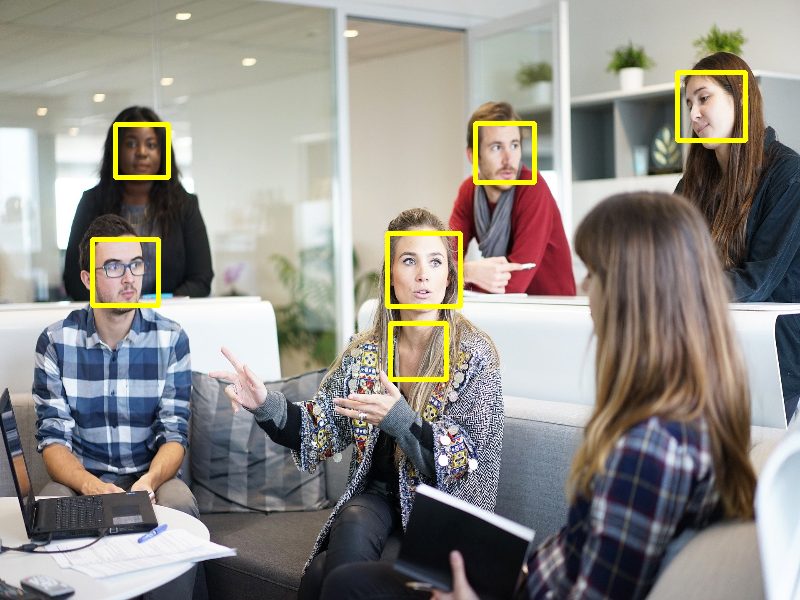

In [16]:
for (x, y, w, h) in detections:
    # print(x, y, w, h)
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 255), 3)
cv2_imshow(image)

### Haarcascade parameters


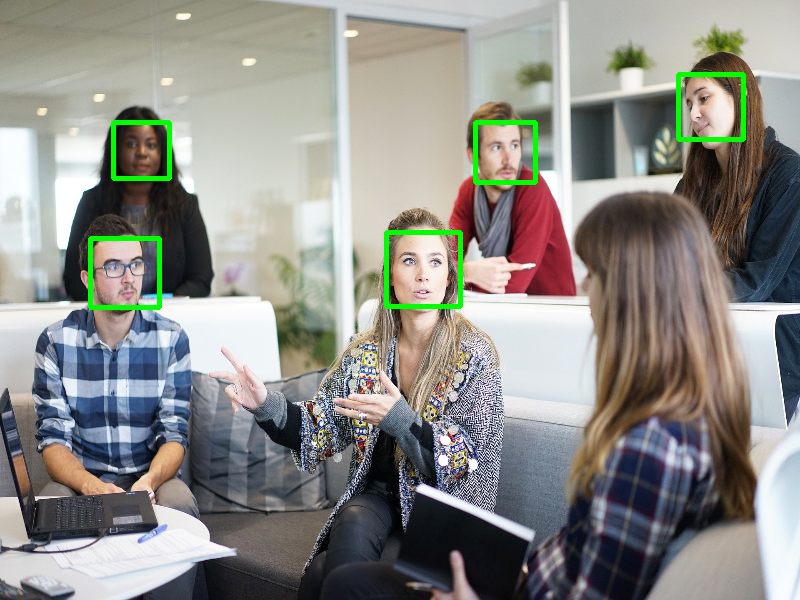

In [17]:
image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/people1.jpg')
image = cv2.resize(image, (800, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.09)
for (x, y, w, h) in detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 3)
cv2_imshow(image)

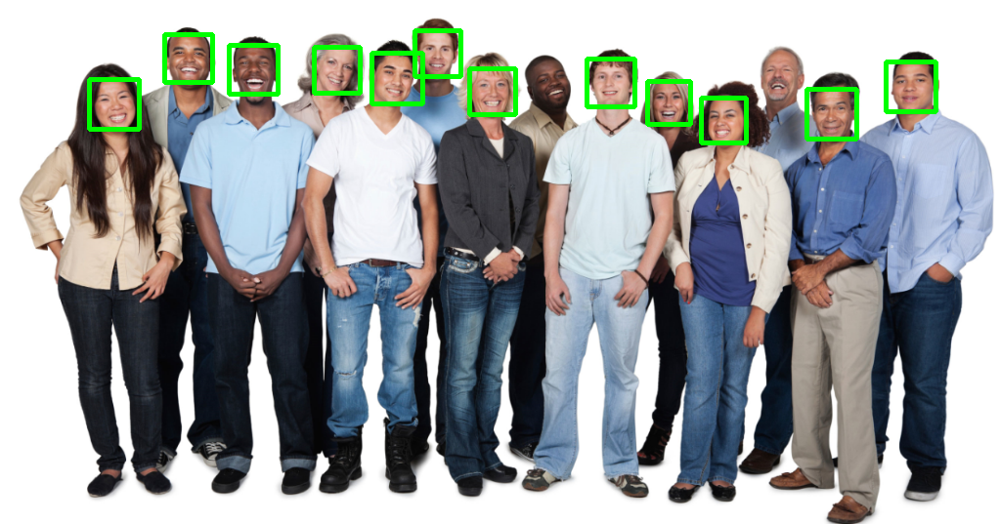

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.2, minNeighbors=7,
                                            minSize=(20, 20), maxSize=(100, 100))
for (x, y, w, h) in detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 3)
cv2_imshow(image)

### Eye detection


In [19]:
eye_detector = cv2.CascadeClassifier(
    '/content/drive/MyDrive/Computer-Vision/Cascades/haarcascade_eye.xml')

In [20]:
image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/people1.jpg')
# image = cv2.resize(image, (800, 600))
# print(image.shape) # 1920x1280 x 3
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

face_detections = face_detector.detectMultiScale(
    image_gray, scaleFactor=1.3, minSize=(30, 30))
for (x, y, w, h) in face_detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 3)

eye_detections = eye_detector.detectMultiScale(
    image_gray, scaleFactor=1.1, minNeighbors=10, maxSize=(70, 70))
for (x, y, w, h) in eye_detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), 2)

cv2_imshow(image)

Output hidden; open in https://colab.research.google.com to view.

### Other objects


#### Cars


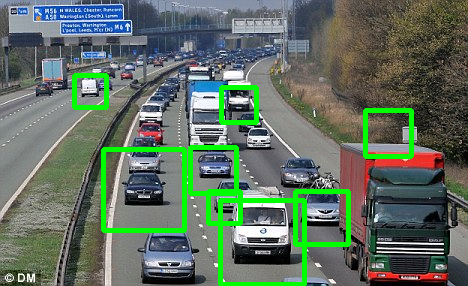

In [ ]:
car_detector = cv2.CascadeClassifier(
    '/content/drive/MyDrive/Computer-Vision/Cascades/cars.xml')

image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/car.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

detections = car_detector.detectMultiScale(
    image_gray, scaleFactor=1.03, minNeighbors=5)
for (x, y, w, h) in detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 3)

cv2_imshow(image)

#### Clocks


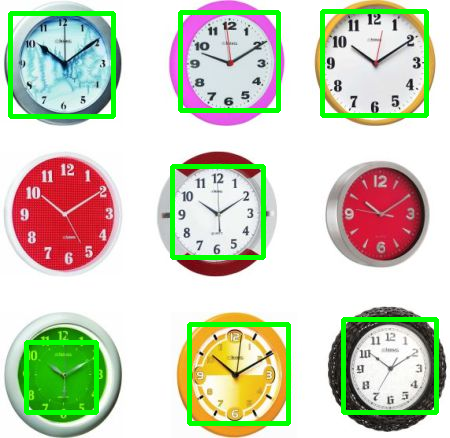

In [ ]:
clock_detector = cv2.CascadeClassifier(
    '/content/drive/MyDrive/Computer-Vision/Cascades/clocks.xml')

image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/clock.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

detections = clock_detector.detectMultiScale(
    image_gray, scaleFactor=1.03, minNeighbors=1)
for (x, y, w, h) in detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 3)

cv2_imshow(image)

#### Full body


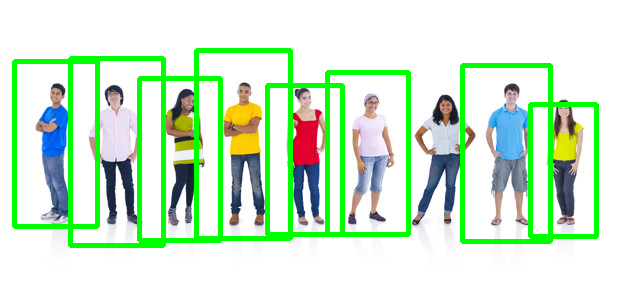

In [ ]:
full_detector = cv2.CascadeClassifier(
    '/content/drive/MyDrive/Computer-Vision/Cascades/fullbody.xml')

image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/people3.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

detections = full_detector.detectMultiScale(image_gray, scaleFactor=1.05, minNeighbors=5,
                                            minSize=(50, 50))
for (x, y, w, h) in detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 3)

cv2_imshow(image)

## Dlib


In [24]:
import dlib

### Detecting faces with HOG


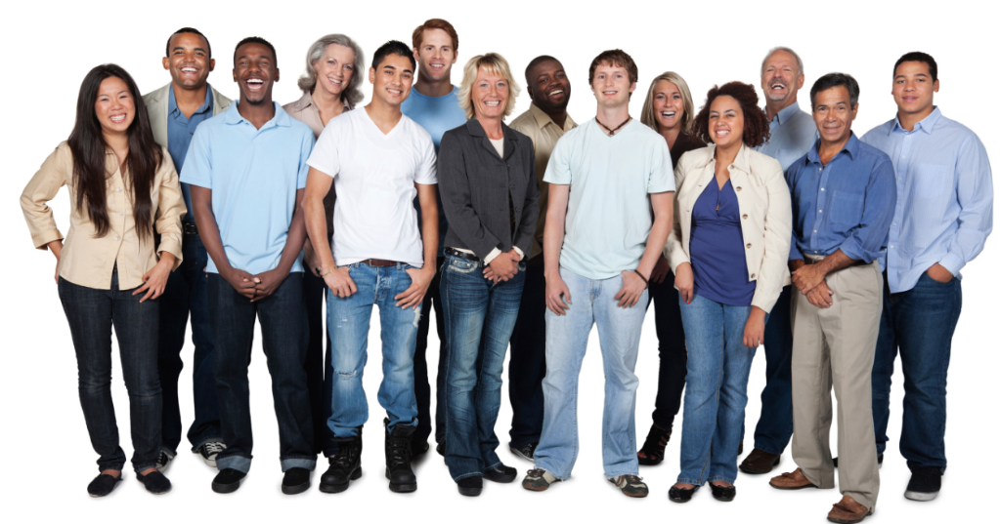

In [25]:
image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/people2.jpg')
cv2_imshow(image)

In [26]:
face_detector_hog = dlib.get_frontal_face_detector()

In [27]:
detections = face_detector_hog(image, 1)

In [28]:
detections

rectangles[[(429, 38) (465, 74)], [(665, 90) (701, 126)], [(717, 103) (760, 146)], [(909, 70) (952, 113)], [(828, 98) (871, 142)], [(605, 70) (641, 106)], [(777, 62) (813, 98)], [(485, 78) (521, 114)], [(386, 60) (429, 103)], [(170, 41) (213, 84)], [(93, 89) (136, 132)], [(237, 50) (280, 94)], [(323, 50) (367, 94)], [(544, 65) (588, 108)]]

In [29]:
len(detections)

14

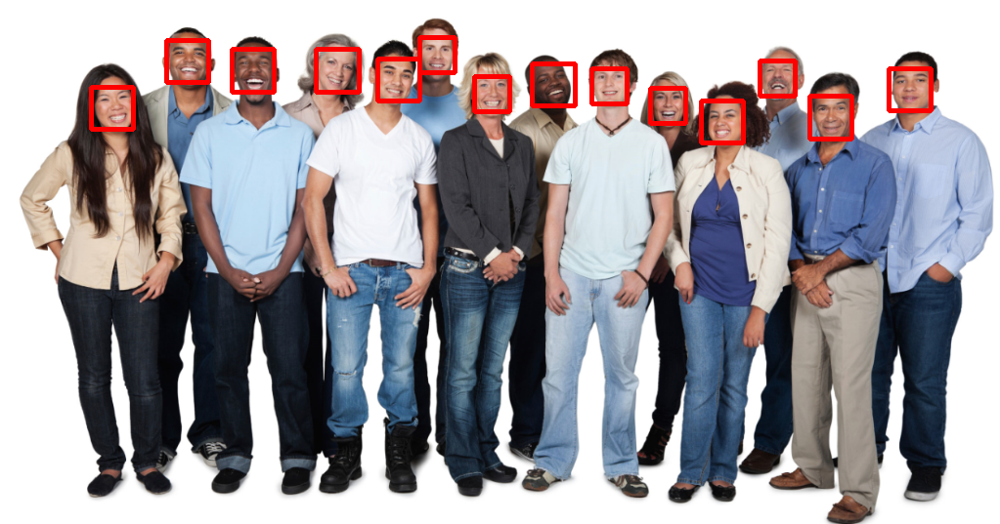

In [30]:
for face in detections:
    # print(face)
    # print(face.left())
    # print(face.top())
    # print(face.right())
    # print(face.bottom())
    l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
    cv2.rectangle(image, (l, t), (r, b), (0, 0, 255), 3)

cv2_imshow(image)

### Detecting faces with CNN (Convolutional Neural Networks)


In [31]:
from mtcnn import MTCNN

In [32]:
image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/people2.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

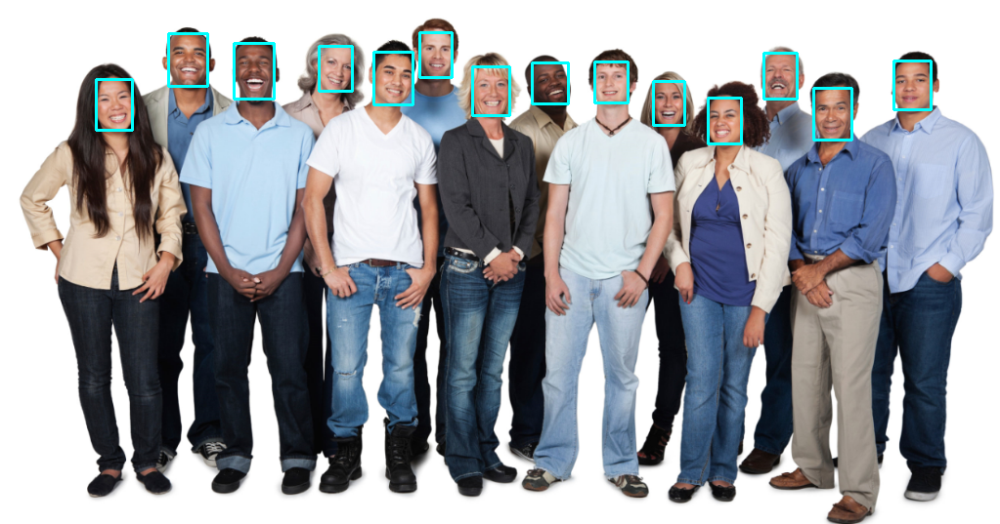

In [33]:
detector = MTCNN()
faces = detector.detect_faces(image_rgb)
filtered_faces = [f for f in faces if f['confidence'] > 0.95]

for face in filtered_faces:
    x, y, w, h = face['box']
    confidence = face['confidence']
    cv2.rectangle(image, (x, y), (x + w, y + h), (255, 255, 0), 2)

cv2_imshow(image)

### Haarcascade x HOG x CNN


#### Haarcascade


In [34]:
image.shape

(537, 1023, 3)

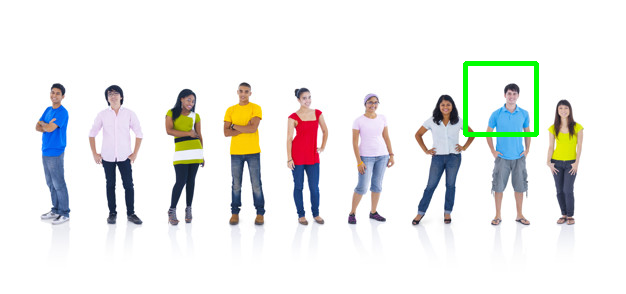

In [35]:
image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/people3.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

haarcascade_detector = cv2.CascadeClassifier(
    '/content/drive/MyDrive/Computer-Vision/Cascades/haarcascade_frontalface_default.xml')
detections = haarcascade_detector.detectMultiScale(
    image_gray, scaleFactor=1.001, minNeighbors=5, minSize=(5, 5))

for (x, y, w, h) in detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 3)

cv2_imshow(image)

#### HOG


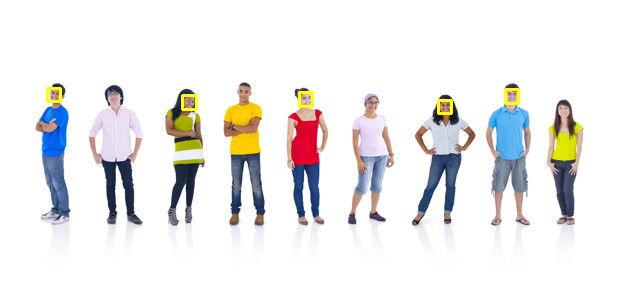

In [36]:
image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/people3.jpg')
face_detector_hog = dlib.get_frontal_face_detector()

detections = face_detector_hog(image, 4)
for face in detections:
    l, t, r, b = (face.left(), face.top(), face.right(), face.bottom())
    cv2.rectangle(image, (l, t), (r, b), (0, 255, 255), 2)

cv2_imshow(image)

#### CNN


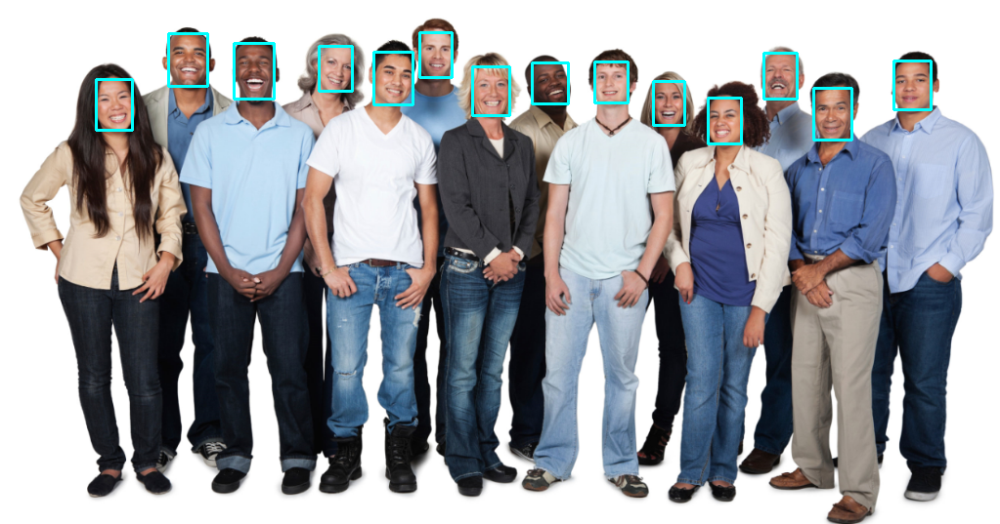

In [37]:
image = cv2.imread('/content/drive/MyDrive/Computer-Vision/Images/people2.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

detector = MTCNN()
faces = detector.detect_faces(image_rgb)
filtered_faces = [f for f in faces if f['confidence'] > 0.95]

for face in filtered_faces:
    x, y, w, h = face['box']
    confidence = face['confidence']
    cv2.rectangle(image, (x, y), (x + w, y + h), (255, 255, 0), 2)

cv2_imshow(image)